# Domain Architecture and Evolution of RRNPP Proteins

Welcome! In this notebook, you will analyze the domain architecture and evolutionary relationships of the RRNPP family of quorum sensing proteins, following the workflow from [this preprint](https://www.biorxiv.org/content/10.1101/2023.09.19.558401v2).

## Objectives
- **Introduction to RRNPP proteins:** Review their roles and domain organization.
- **Domain architecture analysis:** Compare sequences and define core, N-terminal, and C-terminal regions.
- **Homology clustering:** Group and visualize similar regions using graph-based methods.
- **Phylogenetic analysis:** Build and annotate a tree based on core regions.
- **Evolutionary inference:** Map and interpret domain architecture transitions.

## Workflow Overview
1. Introduction to RRNPP proteins
2. Domain architecture analysis
3. Homology clustering
4. Phylogenetic analysis
5. Evolutionary inference and discussion

---

Let's get started!

In [5]:
cd projects/Structural_evo_tutorial/Structural_evo_tutorial/

/home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial


In [6]:
# lets load some functions from foldtree
from fold_tree.src.corecut import *
from fold_tree.src.foldseek2tree import *
from fold_tree.src.AFDB_tools import *

To study the evolutionary history of RRNPP proteins, we will first explore their domain architecture. RRNPP proteins are known to contain a conserved core region, typically associated with their function in quorum sensing. The domain architecture can vary significantly among different RRNPP family members, and understanding these variations is crucial for inferring evolutionary relationships.

First we will visualize some examples.


In [7]:
import glob
rrnppa_structures = glob.glob( 'rrnppa/*.pdb')
uniprotids = [ s.split('/')[-1].split('.')[0] for s in rrnppa_structures ]
print( len(uniprotids)  , 'structures found' )
print( uniprotids[0:5] , '...' )

768 structures found
['A0A2Z4MR52', 'S6FLN1', 'A0A075RCM7', 'A0A7Z2J5F3', 'A0A410DTG4'] ...


In [8]:
import py3Dmol
import glob

# Lets look at some structures with diverse architectures
# List PDB files in the current directory

# Visualize the first 3 structures (if available)
for pdb_file in rrnppa_structures[:3]:
	print(f"Visualizing {pdb_file}")
	with open(pdb_file, 'r') as f:
		pdb_data = f.read()
	view = py3Dmol.view(width=400, height=300)
	view.addModel(pdb_data, 'pdb')
	view.setStyle({'cartoon': {'color': 'spectrum'}})
	view.zoomTo()
	display(view)

Visualizing rrnppa/A0A2Z4MR52.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa/S6FLN1.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa/A0A075RCM7.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
from Bio.PDB import Superimposer, PDBParser
from Bio.PDB import PDBIO
import tempfile
import py3Dmol

def rigid_body_align(structure_path1, structure_path2, chain_id1='A', chain_id2='A'):
	"""
	Align two protein structures using rigid body superposition.

	Returns:
		rmsd (float): Root mean square deviation after alignment.
		super_imposer (Superimposer): Biopython Superimposer object.
		structure1, structure2: Biopython Structure objects (structure2 is superposed).
		view (py3Dmol.view): py3Dmol view showing the superposed structures.
	"""
	parser = PDBParser(QUIET=True)
	structure1 = parser.get_structure('struct1', structure_path1)
	structure2 = parser.get_structure('struct2', structure_path2)

	atoms1 = [atom for atom in structure1[0].get_atoms() if atom.get_id() == 'CA']
	atoms2 = [atom for atom in structure2[0].get_atoms() if atom.get_id() == 'CA']

	min_len = min(len(atoms1), len(atoms2))
	atoms1 = atoms1[:min_len]
	atoms2 = atoms2[:min_len]

	sup = Superimposer()
	sup.set_atoms(atoms1, atoms2)
	sup.apply(structure2.get_atoms())

	# Save structures to temp files for visualization
	io = PDBIO()
	# structure1
	tmp1 = tempfile.NamedTemporaryFile(delete=False, suffix='.pdb')
	io.set_structure(structure1)
	io.save(tmp1.name)
	# structure2 (already superposed)
	tmp2 = tempfile.NamedTemporaryFile(delete=False, suffix='.pdb')
	io.set_structure(structure2)
	io.save(tmp2.name)

	# Visualize with py3Dmol
	with open(tmp1.name) as f1, open(tmp2.name) as f2:
		pdb1 = f1.read()
		pdb2 = f2.read()
	view = py3Dmol.view(width=600, height=400)
	view.addModel(pdb1, 'pdb')
	view.setStyle({'model': 0}, {'cartoon': {'color': 'spectrum'}})
	view.addModel(pdb2, 'pdb')
	view.setStyle({'model': 1}, {'cartoon': {'color': 'magenta'}})
	view.zoomTo()
	return sup.rms, sup, structure1, structure2, view


## Inspecting RRNPP Protein Pairs: Evolutionary Complexity and Structural Diversity

### Introduction

In this section, we will inspect pairs of RRNPP proteins, following an approach similar to the fsx1 example. The RRNPP family is notable for its complex evolutionary history, which is shaped by frequent domain architecture changes and horizontal gene transfer events. These processes contribute to the remarkable diversity observed within this protein family and complicate efforts to reconstruct their evolutionary relationships.

### Biological Background

Once a quorum of cells, plasmids, or viruses is reached, communication peptides are often internalized and bind to the tetratricopeptide repeats (TPRs) of their cognate intracellular receptors. This interaction can activate or inhibit gene or protein expression, enabling a coordinated response that benefits dense microbial populations. RRNPP systems regulate a wide range of behaviors, including:

- **Bacterial virulence**
- **Biofilm formation**
- **Sporulation**
- **Competence**
- **Conjugation**
- **Bacteriophage lysis/lysogeny decisions**

### Challenges in Evolutionary Analysis

Although RRNPP receptors were first identified in the early 1990s, their evolutionary history remains unclear. Frequent mutations and horizontal gene transfers obscure sequence-based comparisons, making it difficult to trace their origins using traditional methods. The family name, RRNPPA, reflects its historical classification into six different receptor families—Rap, Rgg, NprR, PlcR, PrgX, and AimR. Only through detailed structural comparisons has their shared evolutionary origin been established.

### Why Structure Matters

The structural diversity of RRNPP proteins, especially in their N- and C-terminal regions, highlights the importance of focusing on conserved core domains for evolutionary inference. By comparing pairs of structures, we can better appreciate the impact of domain shuffling and horizontal transfer on protein evolution, and understand why structure-based approaches are essential for resolving deep evolutionary relationships in such complex families.

In [10]:
# again, let's try some structure pairs
import itertools
import random
combos = [ ( i, j ) for i, j in itertools.combinations(range(len(rrnppa_structures)), 2) ]
sample = random.sample(combos, 5)
for i, j in sample:
	print( i, j, rrnppa_structures[i], rrnppa_structures[j] )
	rms, sup, structure1, structure2, view = rigid_body_align(rrnppa_structures[i], rrnppa_structures[j])
	view.show()
	print( 'RMSD:', rms)
# The above code will align the first two structures in the list and print the RMSD.
# lets also save the aligned structures
sup.apply(structure2.get_atoms())
# Save the aligned structure


283 555 rrnppa/A0A075QYE8.pdb rrnppa/Q9KBE1.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

RMSD: 20.73482394711451
8 605 rrnppa/A0A383R4W7.pdb rrnppa/A0A410MES7.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

RMSD: 15.092056368697945
410 763 rrnppa/A0A0X8UWJ2.pdb rrnppa/C3EEB6.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

RMSD: 13.048588670720562
110 669 rrnppa/C3HBU9.pdb rrnppa/A0A809FN58.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

RMSD: 9.597571503319402
208 472 rrnppa/A0A856M8Z8.pdb rrnppa/A0A806PIQ5.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

RMSD: 18.875227095646892


### Structural Diversity and Its Impact on Phylogenetic Inference

The RRNPP protein structures analyzed here exhibit a common core fold but display considerable diversity in their overall architectures. 

#### Consequences for Sequence and Structural Distances

- **Sequence Distances:** The inclusion of variable regions inflates sequence distances between proteins, as these regions may be highly divergent or even unrelated by descent.
- **Structural Distances:** Similarly, structural distances (e.g., RMSD) increase when comparing full-length proteins, as the variable regions contribute additional differences not present in the conserved core.
- **Phylogenetic Inference:** Using full-length sequences or structures as input for phylogenetic analysis can obscure true evolutionary relationships. The incongruence introduced by variable regions may lead to inaccurate trees, as the signal from the conserved core is diluted by noise from the divergent regions.

#### Best Practice

To obtain more accurate evolutionary insights, it is advisable to focus on the conserved core region shared by all members of the family. By extracting and analyzing only the core, one can reduce noise from variable regions and improve the reliability of sequence and structural comparisons, as well as downstream phylogenetic inference.

100%|████████████████████████████████████████████████████████████████████████████████| 768/768 [00:27<00:00, 27.50it/s]


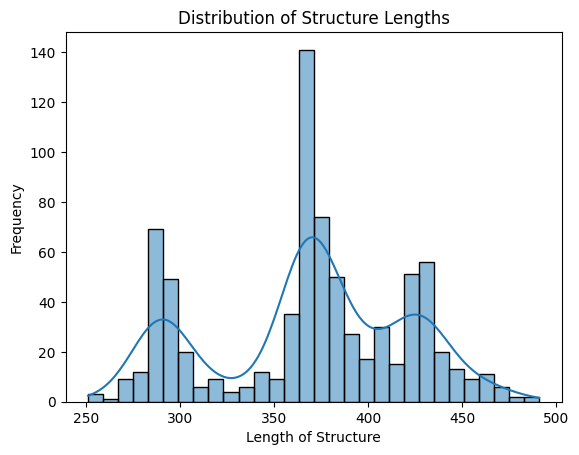

In [11]:
# Let's plot the lengths of all the structures
# we'll just read the sructures and count the residues

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from Bio.PDB import PDBParser
import pandas as pd
import tqdm

lengths = []
for pdb_file in tqdm.tqdm(rrnppa_structures):
	# Parse the PDB file
	parser = PDBParser(QUIET=True)
	structure = parser.get_structure('PDB', pdb_file)
	# Calculate the length of the structure
	length = len(list(structure.get_residues()))
	# Store the length and filename in a list
	lengths.append(length )
# Convert the list to a DataFrame
sns.histplot(lengths, bins=30, kde=True)
plt.xlabel('Length of Structure')
plt.ylabel('Frequency')
plt.title('Distribution of Structure Lengths')
plt.show()

In [12]:
#we can mix these types of metadata with a phylogeny later
from fold_tree.src.foldseek2tree import *


In [ ]:
#there are about 700 structures in the rrnppa folder
#this may take a while to run
import os
if not os.path.exists('rrnppa_foldtree'):
	os.makedirs('rrnppa_foldtree')

comparison , trees = structblob2tree(input_folder = 'rrnppa', outfolder = './' , foldseekpath = 'foldseek'  )
print( 'Foldseek comparison:', comparison )
print( 'Foldseek trees:', trees )

found foldseek output, skipping foldseek
             query      target  fident  alnlen  mismatch  gapopen  qstart  \
0       A0A2S1AH59  A0A2S1AH59   1.000     364         0        0       1   
1       A0A2S1AH59      C2SUH0   0.851     364        54        0       1   
2       A0A2S1AH59      C2URM8   0.826     364        63        0       1   
3       A0A2S1AH59  A0A7D3Y3L0   0.788     364        77        0       1   
4       A0A2S1AH59      Q735S3   0.631     364       134        0       1   
...            ...         ...     ...     ...       ...      ...     ...   
589679  A0A7D4F9I6  A0A1E1GA66   0.147     292       201       17       8   
589680  A0A7D4F9I6  A0A3S8RZW0   0.106     318       209       16      67   
589681  A0A7D4F9I6      Q7CC21   0.107     307       215       17       9   
589682  A0A7D4F9I6  A0A239XEA8   0.107     298       221       14       7   
589683  A0A7D4F9I6      G7VZS9   0.091     327       236       14      57   

        qend  tstart  tend        

## The CoreCut Approach
The CoreCut heuristic developped for our paper focuses on identifying and extracting a consensus "core" region shared among a group of related protein structures. By systematically removing variable N-terminal and C-terminal extensions, CoreCut isolates the structurally conserved segment, enabling more accurate comparative and evolutionary analyses. This method allows for domain-specific studies, reducing noise from divergent terminal regions and facilitating separate analyses for each group of structures based on their conserved cores.

The approach works by searching for regions within each structure that are well-aligned and consistently present across the rest of the dataset. For each structure, CoreCut evaluates which parts map to the majority of other structures. If a region is found to align above a certain threshold (for example, 80% of the dataset), it is considered part of the "core." This consensus-based strategy ensures that only the most conserved and structurally homologous segments are retained for downstream analysis.

In [14]:

extract_core(comparison , outfile= 'rrnppa_foldtree/cores.csv',  hitthresh = .8 ,minthresh = .6, corefolder = 'rrnppa_core_structs/' , structfolder = 'rrnppa/' , cterfolder = 'rrnppa_cter_structs/' , nterfolder = 'rrnppa_nter_structs/' )


./
extracting core
hitthresh: 0.8
minthresh: 0.6
        query      target  fident  alnlen  mismatch  gapopen  qstart  qend  \
0  A0A2S1AH59  A0A2S1AH59   1.000     364         0        0       1   364   
1  A0A2S1AH59      C2SUH0   0.851     364        54        0       1   364   
2  A0A2S1AH59      C2URM8   0.826     364        63        0       1   364   
3  A0A2S1AH59  A0A7D3Y3L0   0.788     364        77        0       1   364   
4  A0A2S1AH59      Q735S3   0.631     364       134        0       1   364   

   tstart  tend        evalue  bits    lddt  \
0       1   364  2.079000e-46  2545  1.0000   
1       1   364  3.686000e-41  2252  0.9925   
2       1   364  2.763000e-40  2207  0.9947   
3       1   364  6.310000e-39  2088  0.9744   
4       1   364  1.792000e-33  1793  0.9525   

                                            lddtfull  alntmscore  
0  1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.00...      1.0000  
1  0.917,0.958,0.941,0.948,0.924,0.988,1.000,1.00...      0.9982 

processed: 768: 100%|████████████████████████████████████████████████████████████████| 768/768 [00:42<00:00, 18.25it/s]


'./struct_cores.csv'

In [ ]:

comparison , trees = structblob2tree(input_folder = 'rrnppa_core_structs/', outfolder = './rrnppa_final' , foldseekpath = 'foldseek'  )
print( 'Foldseek comparison:', comparison )
print( 'Foldseek trees:', trees )

found foldseek output, skipping foldseek
             query      target  fident  alnlen  mismatch  gapopen  qstart  \
0           G7VZS9      G7VZS9   1.000     238         0        0       1   
1           G7VZS9      E0RKZ4   0.863     234        32        0       4   
2           G7VZS9  A0A3S8RZW0   0.578     237       100        0       1   
3           G7VZS9  A0A7H0Y2E7   0.364     239       148        3       3   
4           G7VZS9  A0A2Z2KX58   0.372     239       148        2       1   
...            ...         ...     ...     ...       ...      ...     ...   
589491  A0A7D4BZ44  A0A2I5KLF7   0.127     219       152       14      14   
589492  A0A7D4BZ44      K8E6J0   0.117     238       182        9       4   
589493  A0A7D4BZ44  A0A380KXM9   0.106     301       169       17      21   
589494  A0A7D4BZ44  A0A239XEA8   0.088     270       185       12      28   
589495  A0A7D4BZ44  A0A345VKN9   0.119     293       172       18      46   

        qend  tstart  tend        

In [ ]:
#Just in case this doesnt work, we can also use the precomputed tree
#just uncomment the lines below
#the core and cut structures should also be present in the rrnppa_cter, core and nter folders

#precomputed_tree = './rrnppa_finalfident_distmat.txt_tree.txt.pp.nwk'
#trees = { 'fident': precomputed_tree }

In [109]:
#let's root the tree like we did in excercise 1
#this will give the direction of time for ancestral reconstruction

madpath = './fold_tree/madroot/mad'
import subprocess
def run_mad_on_tree(tree_path, mad_path= madpath):
	cmd = mad_path + ' ' + tree_path
	print( cmd )
	result = subprocess.run(cmd , shell=True, capture_output=True, text=True)
	if result.returncode != 0:
		raise RuntimeError(f"MAD failed: {result.stderr}")
	# Check for the presence of the output files
	return tree_path + '.rooted'

for t in trees:
	print('rooting ' + t + ' ' + trees[t] )
	#get absolute path to the tree
	abs_tree_path = os.path.abspath(trees[t])
	#root the tree with mad
	rooted_tree = run_mad_on_tree(abs_tree_path, mad_path=madpath)
	print('rooted tree:', rooted_tree)

rooting fident ./rrnppa_finalfident_distmat.txt_tree.txt.pp.nwk
./fold_tree/madroot/mad /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finalfident_distmat.txt_tree.txt.pp.nwk
rooted tree: /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finalfident_distmat.txt_tree.txt.pp.nwk.rooted
rooting alntmscore ./rrnppa_finalalntmscore_distmat.txt_tree.txt.pp.nwk
./fold_tree/madroot/mad /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finalalntmscore_distmat.txt_tree.txt.pp.nwk
rooted tree: /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finalalntmscore_distmat.txt_tree.txt.pp.nwk.rooted
rooting lddt ./rrnppa_finallddt_distmat.txt_tree.txt.pp.nwk
./fold_tree/madroot/mad /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finallddt_distmat.txt_tree.txt.pp.nwk
rooted tree: /home/dmoi/projects/Structural_evo_tutorial/Structural_evo_tutorial/rrnppa_finallddt_distmat.txt_t

## Analyzing Non-Core Domains: Clustering and Evolutionary Inference

After focusing on the conserved core regions, we can extend our analysis to the variable N-terminal and C-terminal domains that lie outside the core. These regions often contribute to the functional diversity of RRNPP proteins and are subject to frequent domain shuffling and horizontal gene transfer.

To study the evolutionary dynamics of these non-core domains, we can:
- **Cluster domains by homology:** Group similar N- and C-terminal regions into discrete clusters based on sequence or structural similarity.
- **Map domain clusters onto the phylogeny:** By assigning each protein to its respective domain cluster(s), we can trace the evolutionary history of domain architecture changes across the tree.
- **Infer domain transitions:** Using ancestral state reconstruction methods (such as the Fitch-Sankoff algorithm), we can identify where and when domain gains, losses, or swaps occurred during evolution.

This approach allows us to pinpoint key evolutionary events and better understand how domain shuffling has shaped the diversity and function of the RRNPP protein family.

In [110]:
#let's visualize some n termininal domains
nterminii = glob.glob( 'rrnppa_nter_structs/*')
print( len(nterminii)  , 'structures found' )

sample = random.sample(nterminii, 5)
for i, pdb_file in enumerate(sample):
	print(f"Visualizing {pdb_file}")
	with open(pdb_file, 'r') as f:
		pdb_data = f.read()
	view = py3Dmol.view(width=400, height=300)
	view.addModel(pdb_data, 'pdb')
	view.setStyle({'cartoon': {'color': 'spectrum'}})
	view.zoomTo()
	display(view)

768 structures found
Visualizing rrnppa_nter_structs/A0A410DXN0


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_nter_structs/A0A0H2UPU6


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_nter_structs/P71002


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_nter_structs/A0A345PE41


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_nter_structs/A0A679GZ89


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [111]:
#and now some c terminal domains
cterminii = glob.glob( 'rrnppa_cter_structs/*')
print( len(cterminii)  , 'structures found' )

sample = random.sample(cterminii, 5)
for i, pdb_file in enumerate(sample):
	print(f"Visualizing {pdb_file}")
	with open(pdb_file, 'r') as f:
		pdb_data = f.read()
	view = py3Dmol.view(width=400, height=300)
	view.addModel(pdb_data, 'pdb')
	view.setStyle({'cartoon': {'color': 'spectrum'}})
	view.zoomTo()
	display(view)

768 structures found
Visualizing rrnppa_cter_structs/A0A826GSW8.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_cter_structs/A0A6P1X321.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_cter_structs/B7JU66.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_cter_structs/A0A5C0WCZ0.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Visualizing rrnppa_cter_structs/A0A0J6EBB4.pdb


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [112]:
#let's perform an all vs all comparison with foldseek of each set and establish a homology graph
#we're going to use a function from foldtree to perform the comparison
from fold_tree.src.foldseek2tree import *
allvall_nterminal = runFoldseek_allvall_EZsearch( infolder = 'rrnppa_nter_structs/' , outpath = './allvall_nter_rrnppa.tsv' , foldseekpath = 'foldseek'  )
allvall_cterminal = runFoldseek_allvall_EZsearch( infolder = 'rrnppa_cter_structs/' , outpath = './allvall_cter_rrnppa.tsv' , foldseekpath = 'foldseek'  )

./allvall_nter_rrnppa.tsv exists and will be overwritten
easy-search rrnppa_nter_structs/ rrnppa_nter_structs/ ./allvall_nter_rrnppa.tsv tmp --format-output query,target,fident,alnlen,mismatch,gapopen,qstart,qend,tstart,tend,evalue,bits,lddt,lddtfull,alntmscore --exhaustive-search 

MMseqs Version:              	9.427df8a
Seq. id. threshold           	0
Coverage threshold           	0
Coverage mode                	0
Max reject                   	2147483647
Max accept                   	2147483647
Add backtrace                	false
TMscore threshold            	0
TMalign hit order            	0
TMalign fast                 	1
Preload mode                 	0
Threads                      	32
Verbosity                    	3
LDDT threshold               	0
Sort by structure bit score  	1
Alignment type               	2
Exact TMscore                	0
Substitution matrix          	aa:3di.out,nucl:3di.out
Alignment mode               	3
Alignment mode               	0
E-value threshold      

In [ ]:
#let's visualize the homology heatmap for the n terminal domains
import seaborn as sns

#lets transform the data into a matrix
import pandas as pd
import numpy as np

#load the data

allvall_nterminal = pd.read_csv( 'allvall_nter_rrnppa.tsv' , sep = '\t' , header = None )
allvall_nterminal.columns = 'query,target,fident,alnlen,mismatch,gapopen,qstart,qend,tstart,tend,evalue,bits,lddt,lddtfull,alntmscore'.split(',')

allvall_cterminal = pd.read_csv( 'allvall_cter_rrnppa.tsv' , sep = '\t' , header = None )
allvall_cterminal.columns = 'query,target,fident,alnlen,mismatch,gapopen,qstart,qend,tstart,tend,evalue,bits,lddt,lddtfull,alntmscore'.split(',')

#make a matrix of the data

def make_matrix( df , column = 'fident' ):
	# Create a pivot table to create a matrix
	matrix = df.pivot(index='query', columns='target', values=column)
	names = matrix.columns
	# Fill NaN values with 0
	matrix = matrix.fillna(0)
	# Convert to numpy array
	matrix = matrix.to_numpy()
	return matrix , names

nterminal_matrix , names = make_matrix( allvall_nterminal )
cterminal_matrix , names = make_matrix( allvall_cterminal )


/home/dmoi/miniforge3/envs/pyg/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/dmoi/miniforge3/envs/pyg/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 1000x800 with 0 Axes>

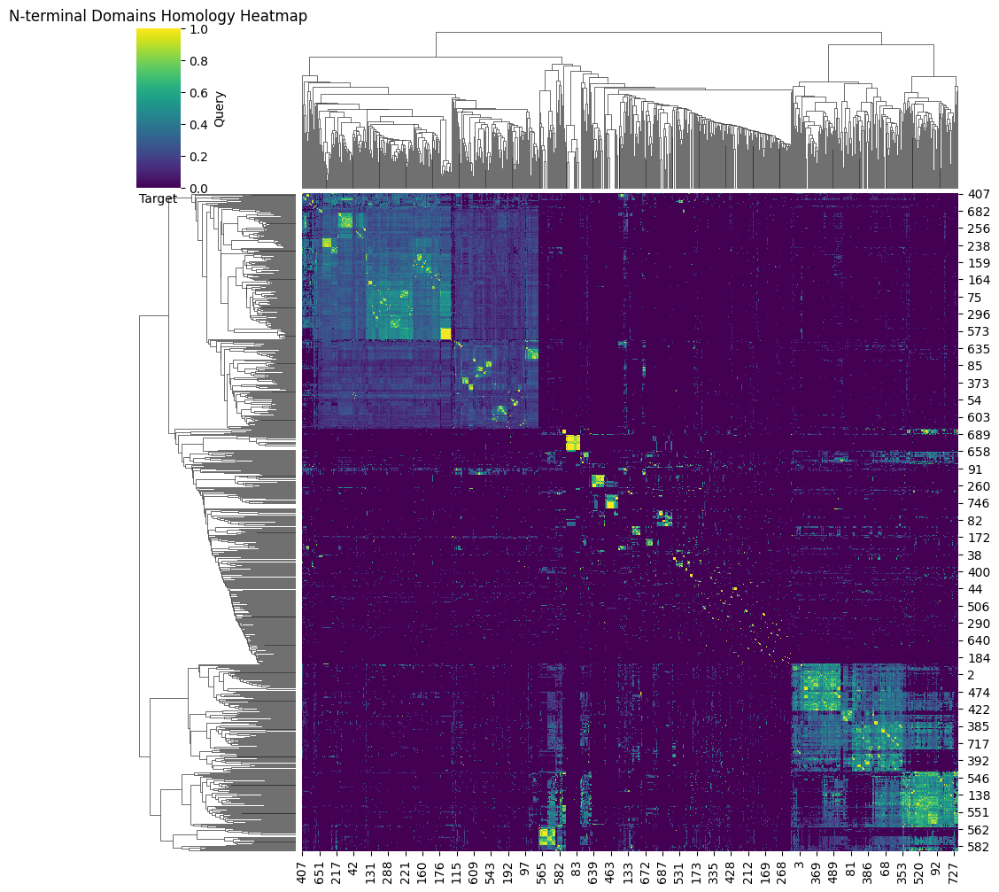

In [114]:

#lets plot the heatmap
plt.figure(figsize=(10, 8))
sns.clustermap(nterminal_matrix, cmap='viridis', cbar=True , )
plt.title('N-terminal Domains Homology Heatmap')
plt.xlabel('Target')
plt.ylabel('Query')

plt.show()

## Interpreting Domain Homology Clusters

The heatmap above reveals several distinct clusters of N-terminal domains among the RRNPPA proteins. These clusters are likely the result of domain shuffling and horizontal gene transfer events that have shaped the evolutionary trajectory and functional diversity of the RRNPPA family.

### Asymmetry in the Homology Matrix

It is important to note that the homology matrix is not symmetrical. This asymmetry arises because the domain fragments being compared are not always the same length, and the alignments are performed locally. As a result, the similarity from domain A to domain B may not be identical to that from B to A. This is a common feature when comparing variable-length protein domains and highlights the complexity of domain architecture evolution.

### Biological Significance of Clusters

Some of the observed clusters correspond to domains with distinct numbers of tetratricopeptide repeats (TPRs). The variation in TPR copy number among clusters suggests that domain duplication, deletion, or recombination events have contributed to the diversification of these proteins. 



In [115]:
from sklearn.cluster import KMeans

# Choose the number of clusters (k). You may want to experiment with this value.
k = 5

# Cluster the N-terminal domains
kmeans_n = KMeans(n_clusters=k, random_state=0)
nterminal_labels = kmeans_n.fit_predict(nterminal_matrix)

# Map each domain to its cluster
nterminal_clusters = dict(zip(names, nterminal_labels))

# Cluster the C-terminal domains
kmeans_c = KMeans(n_clusters=k, random_state=0)
cterminal_labels = kmeans_c.fit_predict(cterminal_matrix)
cterminal_clusters = dict(zip(names, cterminal_labels))

import colour as c
red = c.Color('red')
blue = c.Color('blue')
cmap = [ mapcolor.hex_l for mapcolor in c.Color('red').range_to(c.Color('blue'), k ) ]
print( 'made a color map with %d colors, one for each cluster' % k )


made a color map with 5 colors, one for each cluster


N-terminal Domains Homology Heatmap


/home/dmoi/miniforge3/envs/pyg/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/home/dmoi/miniforge3/envs/pyg/lib/python3.12/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 1000x800 with 0 Axes>

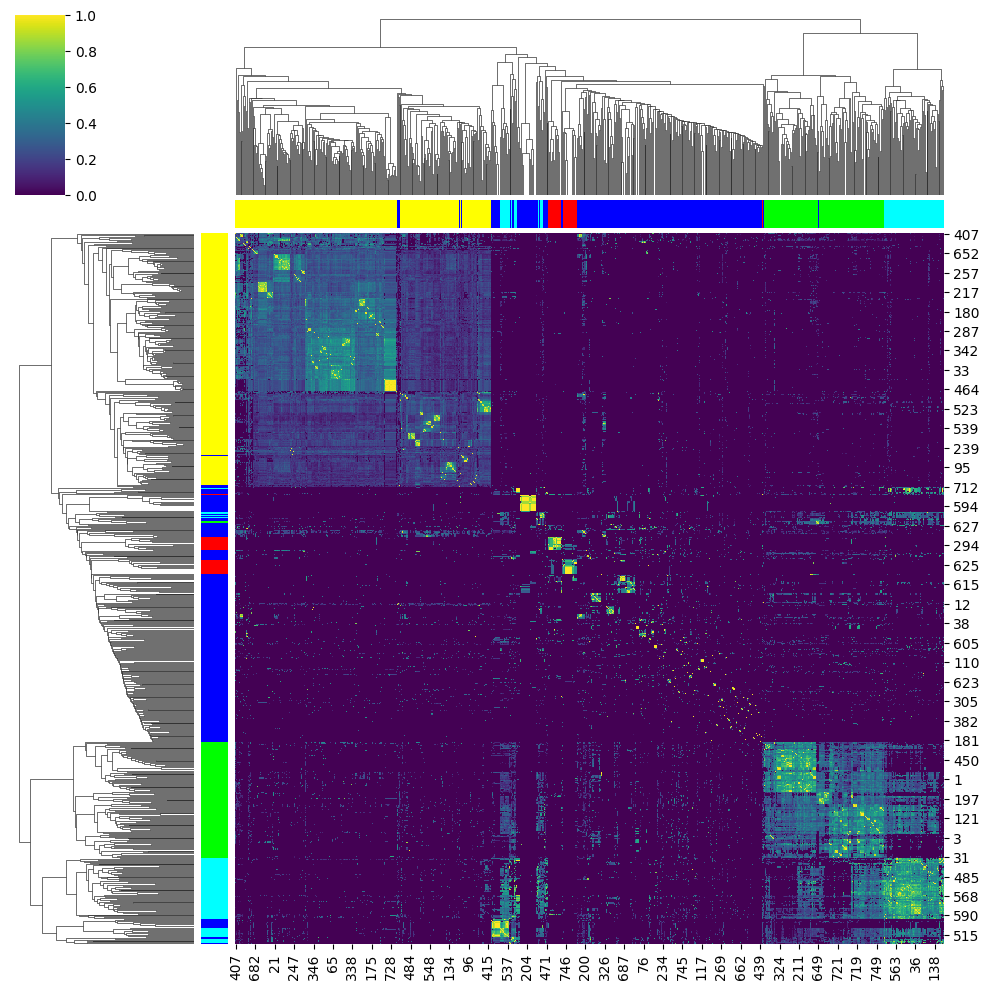

In [116]:
#let's take a look at the clusters on the homology matrix
print( 'N-terminal Domains Homology Heatmap' )
plt.figure(figsize=(10, 8))
row_colors = [ cmap[nterminal_labels[i]] for i in range(len(nterminal_labels)) ]
sns.clustermap(nterminal_matrix, cmap='viridis' , row_colors= row_colors , col_colors= row_colors )


## Evolutionary History and Domain Shuffling in Prokaryotes

### Domain Shuffling Events

Domain shuffling events are common in prokaryotes, leading to proteins with mixed evolutionary origins. Each domain has it's own story. The final tree will be a composite of the histories of the individual domains, which may not always align perfectly.

### Phylogenetic Networks
One topic not covered in this notebook is the use of phylogenetic networks to visualize and analyze the evolutionary relationships among proteins. Phylogenetic networks can capture reticulate evolution, such as horizontal gene transfer and recombination events, which are common in prokaryotic evolution. By representing these complex relationships, phylogenetic networks can provide a more comprehensive view of the evolutionary history of protein families like RRNPPA with all domains included. check out splitstree for more information on this topic. 

####[splitstree](https://uni-tuebingen.de/fakultaeten/mathematisch-naturwissenschaftliche-fakultaet/fachbereiche/informatik/lehrstuehle/algorithms-in-bioinformatics/software/splitstree/)

In [117]:
#now that we have discrete clusters of c and n terminal domains, we can use them in conjunction with the phylogeny 
#we'll be able to figure out where on the tree clusters of domains appeared.
#we would prefer that the core tree explains the emergence of the clusters parsimoniously rather than having many independent origins
#of each cluster of domains. This is a good test of the phylogenetic signal of the domain clusters and 
#an orthogonal test to the phylogenetic signal of the core structure

%load_ext autoreload
%autoreload 2


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload



### Fitch-Sankoff Algorithm for Small Parsimony

The Fitch-Sankoff algorithm is a classic method for solving the small parsimony problem, which seeks the most parsimonious assignment of ancestral states for discrete characters on a fixed tree topology. The algorithm operates in two main passes:

1. **Bottom-Up Pass (Fitch's Algorithm):**  
	For each internal node, the algorithm computes the minimal set of possible states by considering the states of its child nodes. If the child sets intersect, the intersection is used; otherwise, the union is taken, and a change is counted.

2. **Top-Down Pass (Sankoff's Algorithm):**  
	Starting from the root, the algorithm assigns specific states to each node, choosing the most parsimonious options based on the sets computed in the bottom-up pass.

By tracing state transitions at internal nodes, we can infer where biologically meaningful changes—such as domain architecture transitions—occurred along the tree. This approach is particularly useful for mapping the evolutionary history of traits and identifying key innovations in protein families. In this example, we will apply the algorithm to track domain architecture changes across the phylogeny. go ahead take a look at the code in the src directory if this is something that's interesting to you.

In [122]:
import networkx as nx
import colour
import dendropy
from src.fitch2 import *

In [127]:
tree = dendropy.Tree.get_from_path( trees['fident'], 'newick' ,  )
allowed_symbols = set(range(k)).union(set([-1]))
transition_dict = { combo:i for i, combo in enumerate( itertools.product( range(k) , repeat = 2 ) ) }

for i,n in enumerate(tree.nodes()):
	n.event = {}
	n.scores = {}
	n.symbols = None
	n.char= None
	n.matrow = i

for i,l in enumerate(tree.leaf_nodes()):
	l.event = {}
	l.scores = { c:10**10 for c in allowed_symbols }
	if l.taxon.label in nterminal_clusters:
		l.symbols = {nterminal_clusters[l.taxon.label]}
		l.scores[nterminal_clusters[l.taxon.label]] = 0
		l.char = min(l.scores, key=l.scores.get)
	else:
		l.symbols = {-1}
		l.scores[-1] = 0
		l.char = -1

t = calculate_small_parsimony(tree ,allowed_symbols, transition_dict)
labels = np.array( [ n.char for n in t.nodes() ] )
print( 'N-terminal domain clusters:', labels )

N-terminal domain clusters: [1 1 1 ... 4 4 4]


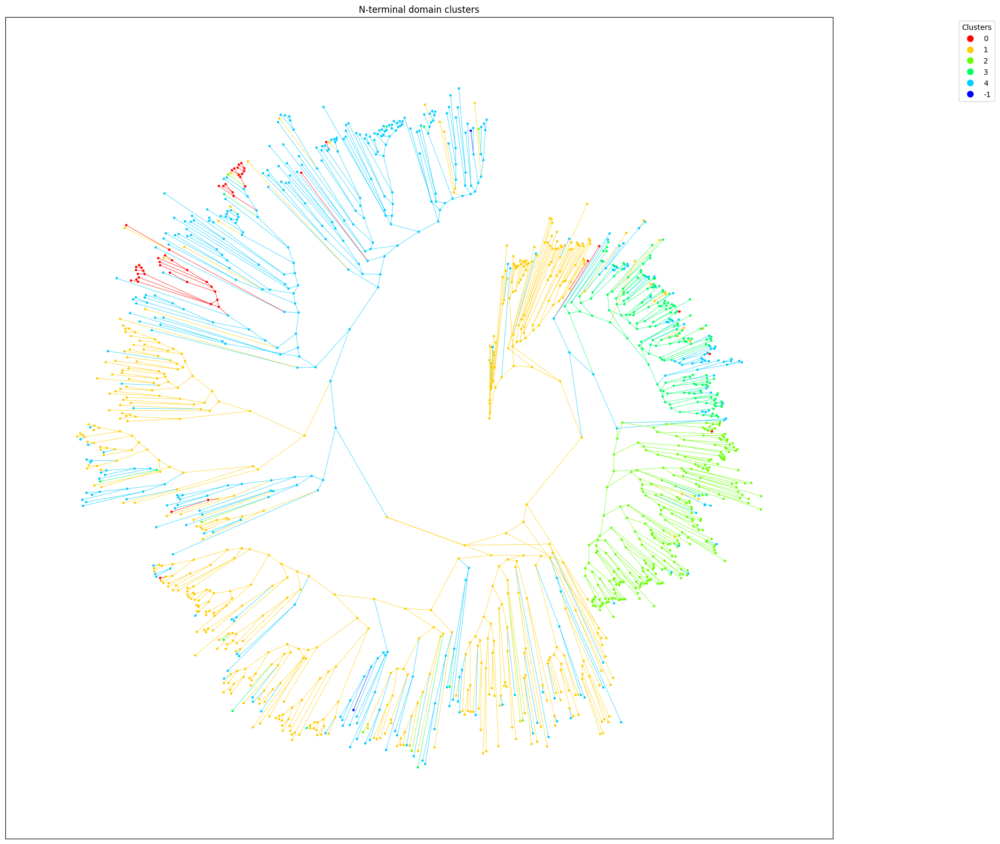

In [ ]:

def tree_circle(node, start , sliver  ):
	if start == True :
		global count
		count = 0
	for i,child in enumerate(node.child_nodes()):
		if child.is_leaf() == True:
			child.radians = count*sliver
			count+=1
		if child.radians is None and child.is_leaf() == False :
			tree_circle( child , start = False , sliver = sliver  )
	radians = np.mean([ child.radians if child.radians else 0 for child in node.child_nodes() ])
	if node.radians is None:
		node.radians = radians

def phylograph(treein,labels , title = None ):
	#most plotting libraries for phylogenies in python are not very good at displaying large ones
	#instead, we can use networkx to plot the phylogeny as a graph since a tree is a special case of a graph
	N = len(treein.nodes())
	tree = copy.deepcopy(treein)
	sliver = 2*np.pi / len(tree.leaf_nodes())
	root = tree.seed_node
	radii = [ n.distance_from_root() for n in tree.nodes()]
	for n in tree.nodes():
		n.radians = None
	tree_circle(tree.seed_node, start=True , sliver = sliver)
	thetas = [n.radians for n in tree.nodes() ]
	pos = { i: [ np.sin(thetas[i])*radii[i] , np.cos(thetas[i])*radii[i]] for i in range(len(thetas)) }
	index = np.vstack([ [n.matrow, c.matrow ] for n in tree.nodes() for c in n.child_nodes()])
	connectmat = np.zeros(( N ,  N ) )
	connectmat[index[:,0],index[:,1]] = 1 
	connectmat += connectmat.T
	G = nx.from_numpy_array(connectmat)
	red = colour.Color("red")
	blue = colour.Color("blue")
	crange = dict( zip ( list(set(labels)),  [ c.hex_l for c in list(red.range_to(blue, len(set(labels)) ) ) ] ) )
	colors = [crange[n] for n in labels ]
	#color according to downstream node
	edge_colors= [crange[labels[v]] for u,v in G.edges() ]    
	plt.figure(figsize= (20,20) )
	nx.draw_networkx(G, pos = pos,  node_color = colors , node_size = 5, width = .5 , edge_color = edge_colors , with_labels=False)
	#add a legend for the colors

	legend_labels = { i: c for i, c in enumerate( set(labels) ) }
	legend_colors = [crange[i] for i in legend_labels.values()]
	legend_patches = [ plt.Line2D([0], [0], marker='o', color='w', label=legend_labels[i], markerfacecolor=legend_colors[i], markersize=10) for i in legend_labels ]
	plt.legend(handles=legend_patches, title="Clusters", loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=10)
	#add a color bar
	if title:
		plt.title(title)
		plt.savefig( title +'_phylograph.svg' )
	plt.show()
phylograph(tree, labels , title = 'N-terminal domain clusters' )

## Emergence of Domain Architectures Along the Phylogeny

### Random vs. Phylogenetically Correlated Emergence

If domain architectures were distributed randomly with respect to the phylogeny, we would expect to see:
- Many independent emergence events for each domain type.
- Domain architectures scattered across the tree, with little regard for evolutionary relationships.

### Observed Pattern: Clade-Specific Retention

However, our analysis reveals a different pattern:
- Most domain architectures appear only a few times on the tree.
- Once a domain architecture emerges, it is generally retained within a specific clade.

### Evolutionary Implications

This pattern suggests:
- Acquisition of new domain architectures is relatively rare.
- Once established, these architectures are stably inherited by descendant lineages.
- Clade-specific retention indicates a strong correlation between domain architecture and evolutionary history.

### Biological Significance

- Domain shuffling events are important but not rampant in shaping protein family diversity.
- The phylogenetically coherent distribution of domains supports the inferred evolutionary relationships.
- Integrating domain architecture information with phylogenetic analysis enhances our understanding of protein evolution.

C-terminal domain clusters: [4 4 4 ... 0 0 0]


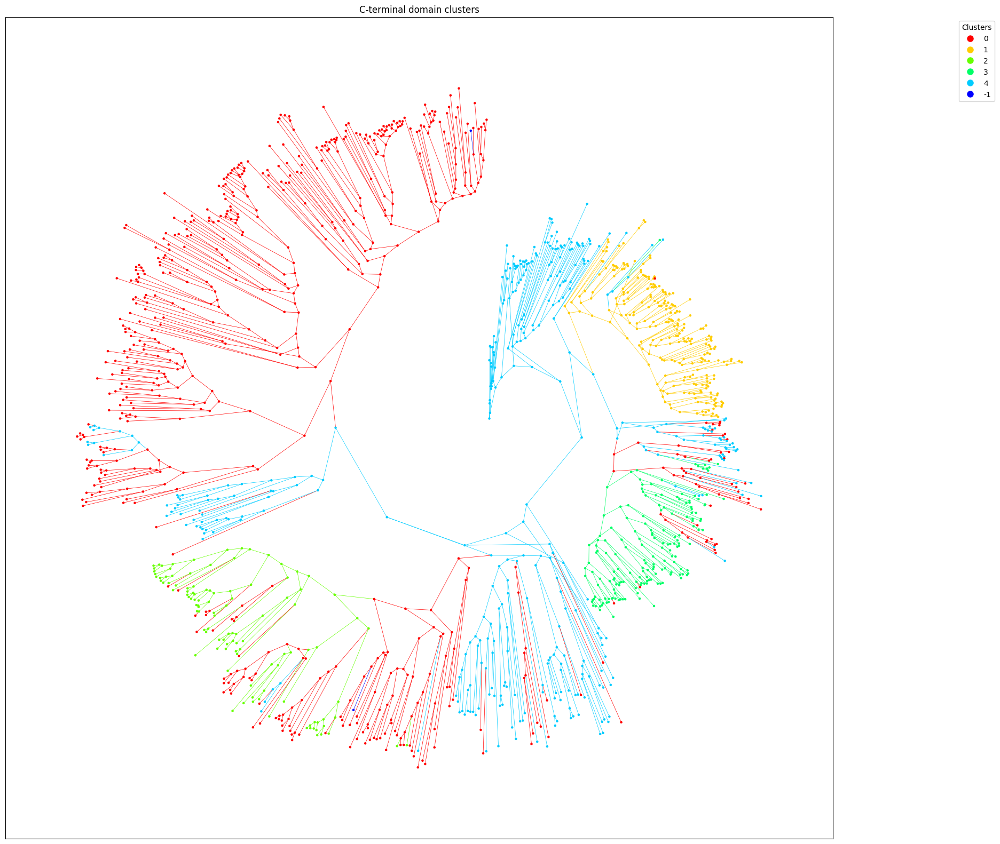

In [130]:
#let's do the same for the c terminal domains
#we can use the same function as above, but we need to change the labels
for i,n in enumerate(tree.nodes()):
	n.event = {}
	n.scores = {}
	n.symbols = None
	n.char= None
	n.matrow = i

for i,l in enumerate(tree.leaf_nodes()):
	l.event = {}
	l.scores = { c:10**10 for c in allowed_symbols }
	if l.taxon.label in cterminal_clusters:
		l.symbols = {cterminal_clusters[l.taxon.label]}
		l.scores[cterminal_clusters[l.taxon.label]] = 0
		l.char = min(l.scores, key=l.scores.get)
	else:
		l.symbols = {-1}
		l.scores[-1] = 0
		l.char = -1

t = calculate_small_parsimony(tree ,allowed_symbols, transition_dict)
labels = np.array( [ n.char for n in t.nodes() ] )
print( 'C-terminal domain clusters:', labels )
phylograph(tree, labels , title = 'C-terminal domain clusters' )

### Ancestral State Reconstruction for Discrete Traits

The small parsimony approach (Fitch-Sankoff algorithm) demonstrated here is broadly applicable to any discrete trait, not just protein domain clusters. Once a tree topology is established, ancestral state reconstruction can be used to infer the most likely states of internal nodes for traits such as gene presence/absence, morphological features, or ecological characteristics.

#### Alternative Reconstruction Methods

While parsimony is simple and efficient, several alternative methods can be used for reconstructing discrete traits on a fixed tree:

- **Maximum Likelihood (ML):**  
    ML methods estimate the probability of ancestral states given a model of character evolution (e.g., Markov models). They provide probabilities for each state at each node, allowing for uncertainty quantification.

- **Bayesian Inference:**  
    Bayesian approaches sample ancestral states from their posterior distribution, integrating over model parameters and providing credible intervals for reconstructions.

- **Stochastic Mapping:**  
    This technique simulates the evolution of discrete traits along the tree, generating possible histories and quantifying the number and timing of transitions.

- **Hidden Markov Models (HMMs):**  
    HMMs can model correlated evolution of multiple traits or account for rate variation across lineages.

Each method has its own strengths and assumptions. The choice depends on the biological question, data quality, and computational resources. Integrating multiple approaches can provide a more robust understanding of trait evolution across the phylogeny.